ΟΝΟΜΑΤΕΠΩΝΥΜΑ: ΑΠΟΣΤΟΛΟΣ ΚΑΡΒΕΛΑΣ / ΙΩΑΝΝΗΣ ΠΑΠΑΔΗΜΗΤΡΙΟΥ  
ΑΜ: 1115201800312 / 1115201800150


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import sys
import matplotlib null
import numpy as np
from pandas import DataFrame
%matplotlib inline 
import heapq
import datetime
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import jaccard_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial import distance
import nltk
from nltk.stem import WordNetLemmatizer

Μετατρέπουμε τα 3 csv αρχεία σε pandas dataframes.

In [ ]:
dataframe_titles = pd.read_csv(r'/content/gdrive/MyDrive/DICources/netflix_titles.csv')  
dataframe_ratings=pd.read_csv(r'/content/gdrive/MyDrive/DICources/IMDb ratings.csv')
dataframe_movies=pd.read_csv(r'/content/gdrive/MyDrive/DICources/IMDb movies.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


1. 
Διατρέχουμε το netflix_titles dataframe και για κάθε Movie/TV Show που βρίσκουμε στην στήλη 'type' αυξάνουμε τον αντίστοιχο μετρητή. Ύστερα, τα εκτυπώνουμε σε μορφή γράφου μπάρας.

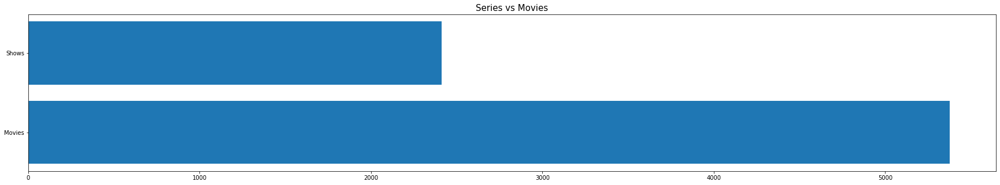

In [ ]:
movie_count=0
series_count=0
for i in dataframe_titles.iloc[:,1]:
  if i=='Movie':
    movie_count+=1
  elif i=='TV Show':
    series_count+=1

fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title('Series vs Movies', fontsize=15)
plt.barh(['Movies','Shows'], [movie_count,series_count])
plt.show()  


2.
Ομοίως, διατρέχουμε το netflix_titles dataframe για κάθε Movie/TV Show  που βρίσκουμε στην στήλη 'type' και εαν η ημερομηνία κυκλοφορίας είναι μετά του 2015 αυξάνουμε τον αντίστοιχο μετρητή. Ύστερα, τα εκτυπώνουμε σε μορφή γράφου μπάρας.


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


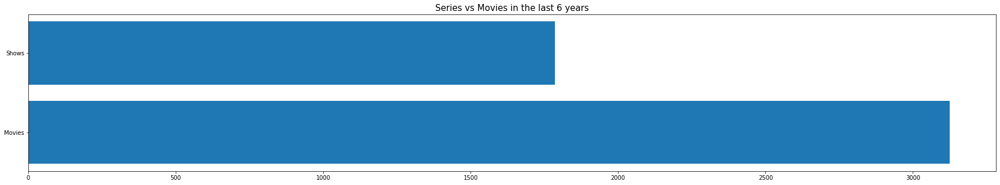

In [ ]:
new_movie_count=0
new_series_count=0
for i in range(0,dataframe_titles.shape[0]):
  if dataframe_titles.iloc[i,1]=='Movie' and int(dataframe_titles.iloc[i,7])>2015:
    new_movie_count+=1
  elif dataframe_titles.iloc[i,1]=='TV Show' and int(dataframe_titles.iloc[i,7])>2015:
    new_series_count+=1
fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title('Series vs Movies in the last 6 years', fontsize=15)
plt.barh(['Movies','Shows'], [new_movie_count,new_series_count])
plt.show()  

3.
Στην αρχή σε κάθε εγγραφή που υπάρχουν 2 ή περισσότερες χώρες, δημιουργούμε μία νέα εγγραφή για κάθε χώρα και τις ομαδοποιούμε με βάση τη χώρα. Έπειτα, βρίσκουμε το περιεχόμενο της κάθε χώρας με την συνάρτηση size και διατρέχουμε το dataframe μέχρι να βρούμε την χώρα με το μεγαλύτερο όγκο περιεχομένου.

In [ ]:
dummy_df1=dataframe_movies
dummy_df2=pd.concat([pd.Series(row['genre'], str(row['country']).split(','))for _, row in dummy_df1.iterrows()]).reset_index()    
dummy_df2['index']=dummy_df2['index'].str.replace(' ','')

In [ ]:
most_content=dummy_df2.groupby(dummy_df2.columns.tolist()[0],as_index=False).size()
for i in range(most_content.shape[0]):
 if most_content.iloc[i,1]==most_content.iloc[:,1].max():
   print(most_content.iloc[i,0])
   print(most_content.iloc[i,1],"movies or series")

USA
34325 movies or series


4.
Ομαδοποιούμε το προηγούμενο dataframe με βάση τη χώρα και διατρέχουμε τη κάθε εγγραφή. Για τη λίστα από genres της κάθε χώρας δημιουργούμε μία λίστα όλα τα  όνοματα genre που εντοπίσαμε τουλάχιστον μία φορά.

In [ ]:
groups=dummy_df2.groupby('index')[0].apply(list).reset_index()
for i in range(len(groups[0])-1):
  mylist=[]
  for ii in range(len(groups[0][i])):
    for iii in range(len(groups[0][i][ii])):
      words=groups[0][i][ii].split(',')
      for iiii in range(len(words)):
        words[iiii]=words[iiii].replace(' ','')
        if words[iiii] not in mylist:
          mylist.append(words[iiii])
  print(groups['index'][i],mylist)

Afghanistan ['Adventure', 'Biography', 'Drama', 'War', 'History', 'Romance']
Albania ['Action', 'Drama', 'History', 'Comedy', 'War', 'Family', 'Romance', 'Adventure', 'Thriller', 'Crime', 'Horror', 'Mystery']
Algeria ['Drama', 'War', 'Crime', 'History', 'Adventure', 'Fantasy', 'Musical', 'Comedy', 'Biography', 'Action', 'Mystery', 'Romance', 'Thriller']
Andorra ['Horror', 'Comedy', 'Drama', 'Thriller']
Angola ['Drama', 'War', 'Action', 'Comedy', 'Fantasy', 'Horror', 'Crime']
Argentina ['Drama', 'Musical', 'History', 'Western', 'Comedy', 'Adventure', 'Horror', 'Sci-Fi', 'Fantasy', 'Thriller', 'Biography', 'Romance', 'Animation', 'Mystery', 'Crime', 'War', 'Action', 'Family', 'Sport', 'Music']
Armenia ['Drama', 'Comedy', 'Romance', 'Musical', 'Adventure', 'Animation', 'War', 'Family', 'Action', 'Crime', 'History', 'Thriller']
Aruba ['Action', 'Crime', 'Thriller', 'Adventure', 'Comedy', 'Drama']
Australia ['Biography', 'Crime', 'Drama', 'Romance', 'Action', 'History', 'War', 'Adventure', 

5.
Ομοίως με το προηγούμενο υποερώτημα, αλλά αντί για genre χρησιμοποιούμε τη στήλη cast και τα συσχετίζουμε με τη στήλη country εφόσον έχουν type=='Movie', ώστε να βρούμε σε ποια χώρα ανοίκει ο κάθε ηθοποιός. Από τη ταξινομημένη λίστα που προκύπτει κρατάμε τους πρώτους 10 ηθοποιούς. 


In [ ]:
Movie_dataframe=pd.DataFrame() 
Series_dataframe=pd.DataFrame() 
no_nan_movie_df=pd.DataFrame() 
no_nan_movie_df=no_nan_movie_df.append(dataframe_titles[dataframe_titles['cast'].notnull()] )
Movie_dataframe= Movie_dataframe.append(no_nan_movie_df[no_nan_movie_df['type'] == 'Movie'] )
Series_dataframe= Series_dataframe.append(no_nan_movie_df[no_nan_movie_df['type'] == 'TV Show'])
netflix_dummy=pd.concat([pd.Series(row['cast'],str(row['country']).split(','))for _, row in Movie_dataframe.iterrows()]).reset_index()
netflix_dummy['index']=netflix_dummy['index'].str.replace(' ','')

netflix_dummy_series=pd.concat([pd.Series(row['cast'],str(row['country']).split(','))for _, row in Series_dataframe.iterrows()]).reset_index()
netflix_dummy_series['index']=netflix_dummy_series['index'].str.replace(' ','')


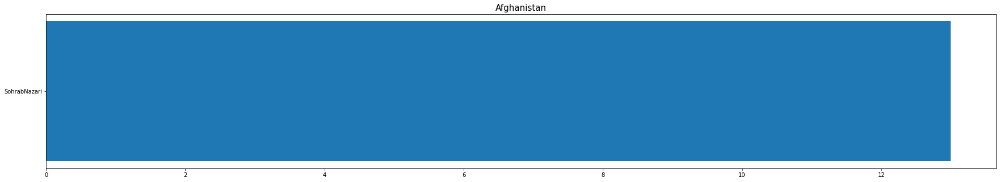

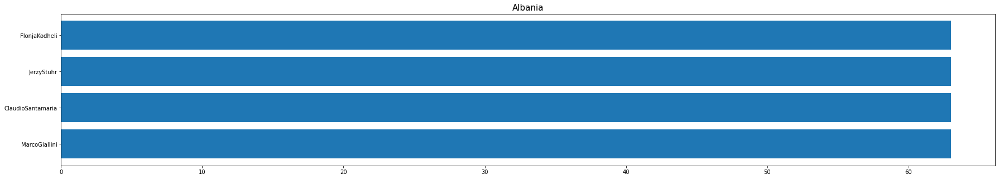

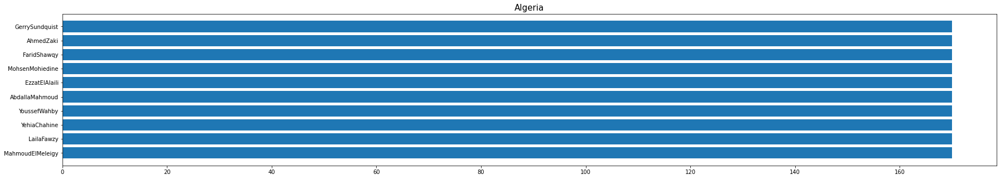

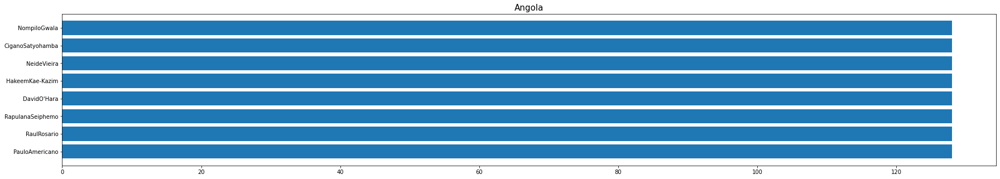

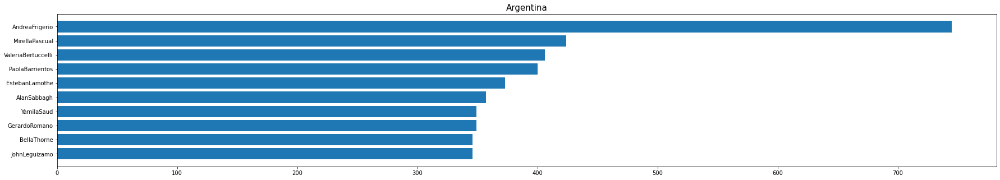

...

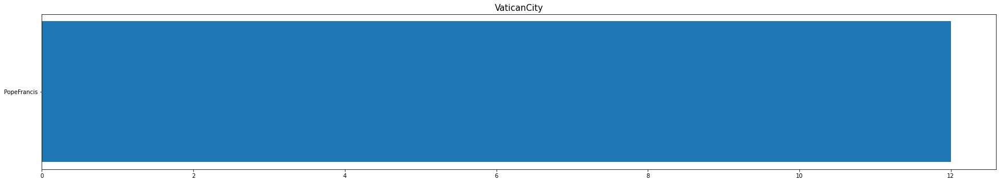

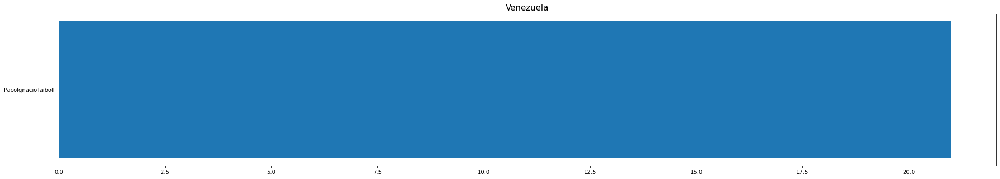

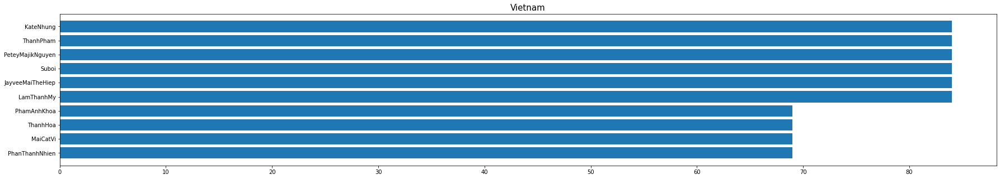

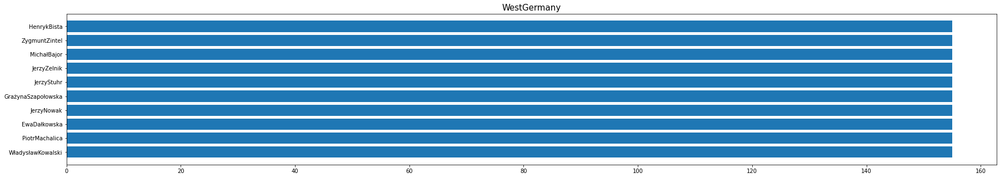

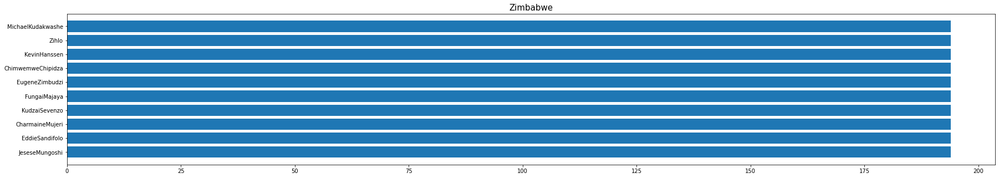

In [ ]:
netflix_dummy2=netflix_dummy.groupby('index')[0].apply(list).reset_index()
actornames=[]
actorappearences=[]
for i in range(1,netflix_dummy2.shape[0]-1):
  actornames=[]
  actorappearences=[]
  for ii in range(len(netflix_dummy2[0][i])):
    for iii in range(len(netflix_dummy2[0][i][ii])):
      words=netflix_dummy2[0][i][ii].split(',')
      for iiii in range(len(words)):
        words[iiii]=words[iiii].replace(',','')
        words[iiii]=words[iiii].replace(' ','')
        if words[iiii] not in actornames:
          actornames.append(words[iiii])
          actorappearences.append(1)
        else:
          actorappearences[actornames.index(words[iiii])]+=1


  
  top_10_idx = np.argsort(actorappearences)[-10:]
  top_10_values = [actorappearences[l] for l in top_10_idx]
  top_10_actors = [actornames[l] for l in top_10_idx]

  fig,ax = plt.subplots()
  fig.set_size_inches(30,5)
  font = {'family' : 'normal',
          'weight' : 'normal',
          'size'   : 10}

  matplotlib.rc('font', **font)

  plt.title(netflix_dummy2.iloc[i]['index'], fontsize=15)
  plt.barh(top_10_actors, top_10_values)
  plt.show()  


Ομοίως με το προηγούμενο, αλλά για τις σειρές.


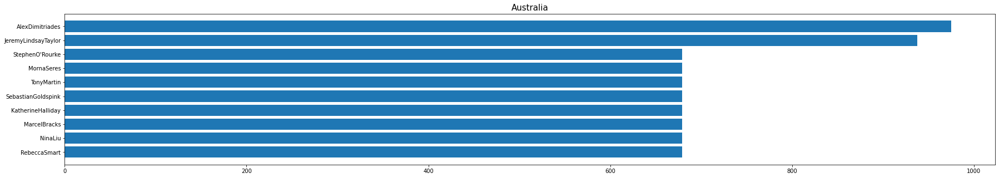

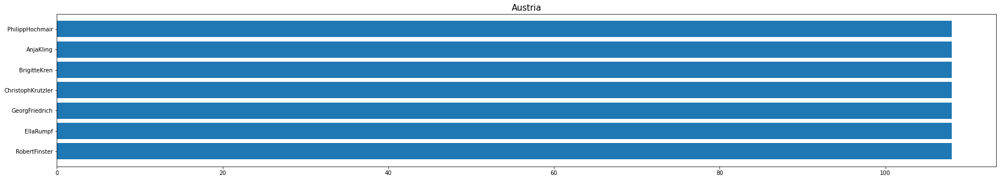

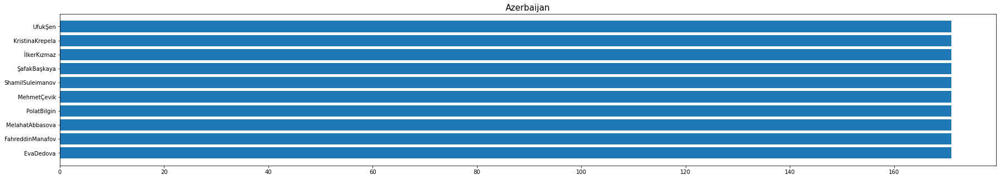

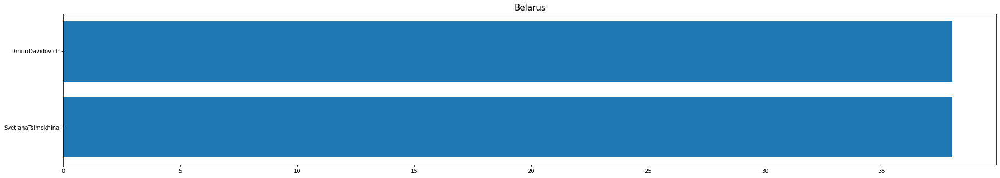

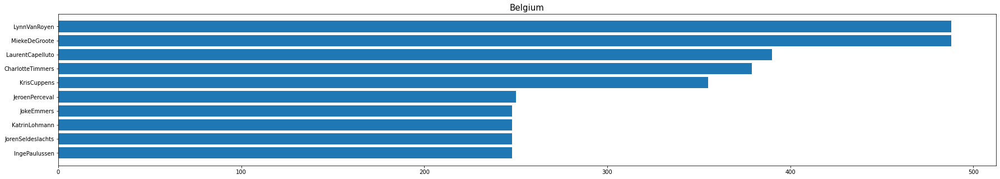

...

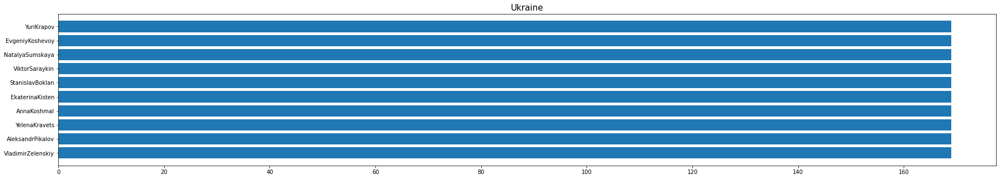

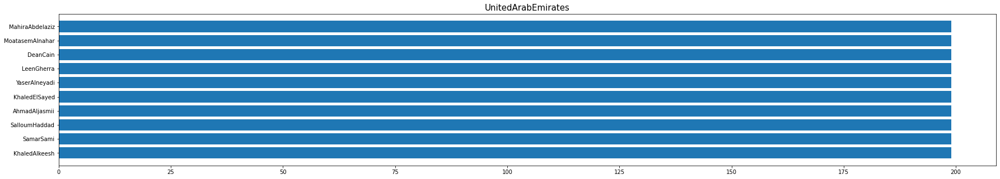

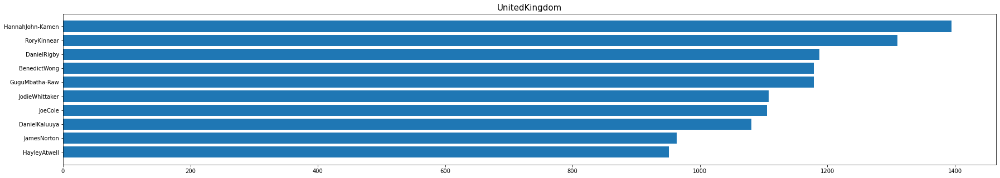

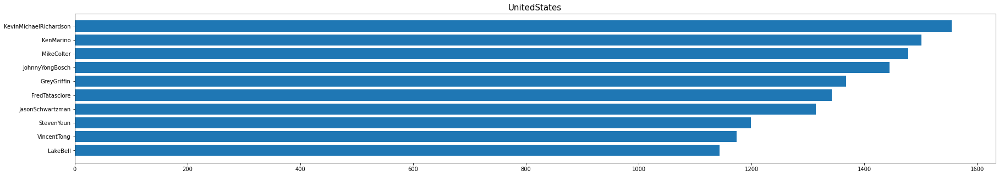

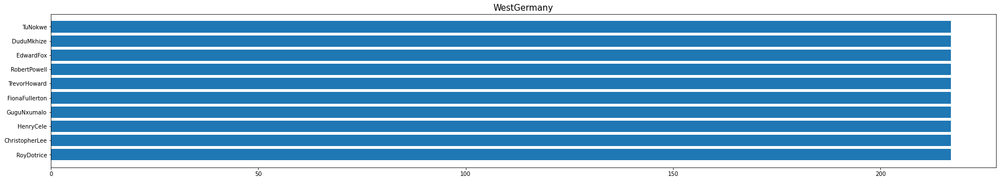

In [ ]:
netflix_dummy3=netflix_dummy_series.groupby('index')[0].apply(list).reset_index()
netflix_dummy3[0]
actornames=[]
actorappearences=[]
for i in range(1,netflix_dummy3.shape[0]-1):
  actornames=[]
  actorappearences=[]
  for ii in range(len(netflix_dummy3[0][i])):
    for iii in range(len(netflix_dummy3[0][i][ii])):
      words=netflix_dummy3[0][i][ii].split(',')
      for iiii in range(len(words)):
        words[iiii]=words[iiii].replace(',','')
        words[iiii]=words[iiii].replace(' ','')
        if words[iiii] not in actornames:
          actornames.append(words[iiii])
          actorappearences.append(1)
        else:
          actorappearences[actornames.index(words[iiii])]+=1
          
  top_10_idx = np.argsort(actorappearences)[-10:]
  top_10_values = [actorappearences[l] for l in top_10_idx]
  top_10_actors = [actornames[l] for l in top_10_idx]
  fig,ax = plt.subplots()
  fig.set_size_inches(30,5)
  font = {'family' : 'normal',
          'weight' : 'normal',
          'size'   : 10}
  matplotlib.rc('font', **font)

  plt.title(netflix_dummy3.iloc[i]['index'], fontsize=15)
  plt.barh(top_10_actors, top_10_values)
  plt.show()  

  

6. Πρώτα, καθαρίζουμε το dataframe από τα NaN records και το χωρίζουμε σε δύο διαφορετικά dataframes αναλόγως του type. Ύστερα διατρέχουμε το κάθε dataframe και με βάση το rating αυξάνουμε τον ανάλογο μετρητή. Τέλος, εκτυπώνουμε τα δεδομένα σε μορφή μπάρας.


In [ ]:
Movie_rating_dataframe=pd.DataFrame() 
Series_rating_dataframe=pd.DataFrame()

rating_movie_df=pd.DataFrame() 
rating_movie_df=rating_movie_df.append(dataframe_titles[dataframe_titles['rating'].notnull()])

Movie_rating_dataframe=Movie_rating_dataframe.append(rating_movie_df[rating_movie_df['type'] == 'Movie'])
Series_rating_dataframe=Series_rating_dataframe.append(rating_movie_df[rating_movie_df['type'] == 'TV Show'])

['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', 'PG', 'G', 'TV-Y7', 'NC-17', 'TV-Y7-FV', 'UR']
[1845, 663, 386, 1272, 505, 79, 111, 117, 247, 39, 95, 3, 5, 5]
[267, 852, 1658, 2511]


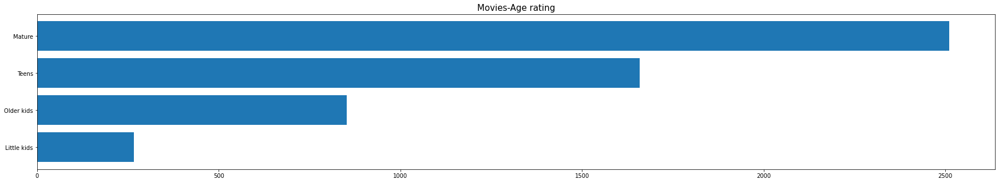

In [ ]:
rating_list = []
rating_counter_list = []
cat_rating_counter_list=[]
for i in range(Movie_rating_dataframe.shape[0]):
  if Movie_rating_dataframe.iloc[i,8] not in rating_list:
    rating_list.append(Movie_rating_dataframe.iloc[i,8])
    rating_counter_list.append(1)
  else:
    rating_counter_list[rating_list.index(Movie_rating_dataframe.iloc[i,8])]+=1
print(rating_list)
print(rating_counter_list)
cat_rating_counter_list=[0 for i in range(4)]
for i in rating_list:
  if i=='G' or i=='TV-Y' or i=='TV-G':
    cat_rating_counter_list[0]+= rating_counter_list[rating_list.index(i)]
  elif i=='PG' or i=='TV-Y7' or i =='TV-Y7-FV' or i=='TV-PG':
    cat_rating_counter_list[1]+= rating_counter_list[rating_list.index(i)]
  elif i=='PG-13' or i=='TV-14':
    cat_rating_counter_list[2]+= rating_counter_list[rating_list.index(i)]
  elif i=='R' or i=='NC-17' or i=='TV-MA':
    cat_rating_counter_list[3]+= rating_counter_list[rating_list.index(i)]

print(cat_rating_counter_list)
myarray=['Little kids','Older kids','Teens','Mature']


fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title("Movies-Age rating", fontsize=15)
plt.barh(myarray, cat_rating_counter_list)
plt.show()  



['TV-MA', 'TV-14', 'TV-PG', 'TV-Y7', 'TV-G', 'TV-Y', 'NR', 'R', 'TV-Y7-FV']
[1018, 659, 301, 176, 83, 163, 5, 2, 1]
[246, 478, 659, 1020]


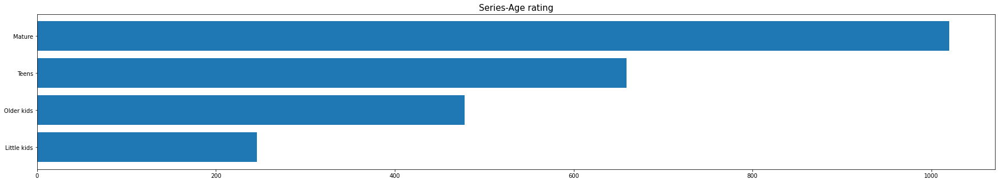

In [ ]:
rating_list = []
rating_counter_list = []
cat_rating_counter_list=[]
for i in range(Series_rating_dataframe.shape[0]):
  if Series_rating_dataframe.iloc[i,8] not in rating_list:
    rating_list.append(Series_rating_dataframe.iloc[i,8])
    rating_counter_list.append(1)
  else:
    rating_counter_list[rating_list.index(Series_rating_dataframe.iloc[i,8])]+=1
print(rating_list)
print(rating_counter_list)
cat_rating_counter_list=[0 for i in range(4)]
for i in rating_list:
  if i=='G' or i=='TV-Y' or i=='TV-G':
    cat_rating_counter_list[0]+= rating_counter_list[rating_list.index(i)]
  elif i=='PG' or i=='TV-Y7' or i =='TV-Y7-FV' or i=='TV-PG':
    cat_rating_counter_list[1]+= rating_counter_list[rating_list.index(i)]
  elif i=='PG-13' or i=='TV-14':
    cat_rating_counter_list[2]+= rating_counter_list[rating_list.index(i)]
  elif i=='R' or i=='NC-17' or i=='TV-MA':
    cat_rating_counter_list[3]+= rating_counter_list[rating_list.index(i)]
    
print(cat_rating_counter_list)
myarray=['Little kids','Older kids','Teens','Mature']

fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title("Series-Age rating", fontsize=15)
plt.barh(myarray, cat_rating_counter_list)
plt.show()  


7.
Κρίνουμε ότι τα δεδομένα που θα επιτρέψουν στον παραγωγό να επιλέξει την σωστή χρονική περίοδο είναι ο αριθμός περιεχομένου τα τελευταία πέντε χρόνια. Αυτο το επιτυγχάνουμε παίρνοντας για κάθε μήνα τον αριθμό των ταινιών. Το αποτέλεσμα το εκτυπώνουμε σε μορφή γράφου με βήμα έναν μήνα.


In [ ]:
empty_df=pd.DataFrame()
release_movie_df=pd.DataFrame() 
release_movie_df=release_movie_df.append(dataframe_titles[dataframe_titles['date_added'].notnull()])
empty_df=empty_df.append(dataframe_titles[dataframe_titles['type']=='Movie'])

8


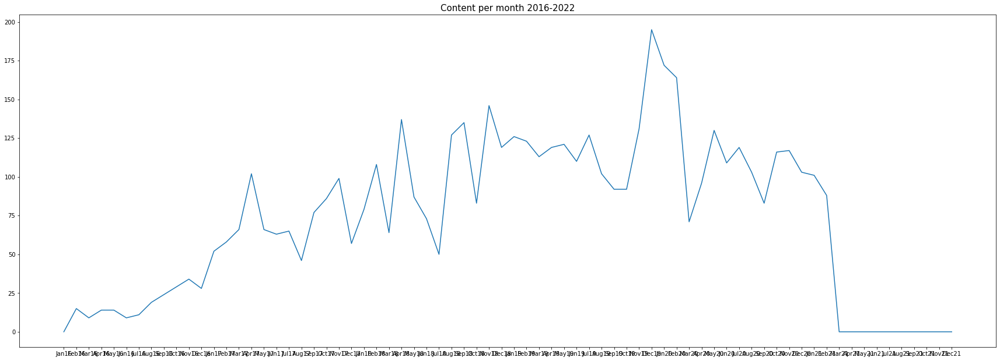

In [ ]:
datetime_object = datetime.datetime.strptime("August","%B")
month_number = datetime_object.month
print(month_number)
movies_release_number=[0 for i in range(6*12)]
for i in range(empty_df.shape[0]):
  mystr=empty_df.iloc[i,6]
  words=str(mystr).split(',')
  month1=words[0].split(' ')[0].replace(' ','')
  year=words[1].replace(' ','')
  if int(year)>=2016 and int(year)<2022:
    movies_release_number[(int(year)-2016)*12+int(datetime.datetime.strptime(month1,"%B").month)]+=1

data_list=[datetime.datetime.strptime(str((i)%12+1),"%m").strftime("%b")+str(16+int(int(i)/12)) for i in range(6*12)]
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(30, 10.5)
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 8}
plt.title("Content per month 2016-2022", fontsize=15)
matplotlib.rc('font', **font)
plt.plot(data_list,movies_release_number)



8.

Στο υποερώτημα αυτό για κάθε εγγραφή με δύο ή περισσότερα είδη περιεχομένου δημιουργούμε μία καινούρια εγγραφή για κάθε ένα από αυτά και διατρέχουμε τη στήλη listed_in.Για κάθε είδος περιεχομένου δημιουργούμε έναν μετρητή ή τον αυξάνουμε εαν το έχουμε ξαναβρεί. 


In [ ]:
listed_in_dataframe=pd.DataFrame() 
no_nan_listed_in=pd.DataFrame() 
no_nan_listed_in=no_nan_listed_in.append(dataframe_titles[dataframe_titles['listed_in'].notnull()] )

[('InternationalMovies', 'Dramas', 'Comedies', 'InternationalTVShows', 'Documentaries', 'Action&Adventure', 'TVDramas', 'IndependentMovies', 'Children&FamilyMovies', 'RomanticMovies', 'TVComedies', 'Thrillers', 'CrimeTVShows', "Kids'TV", 'Docuseries', 'RomanticTVShows', 'Stand-UpComedy', 'Music&Musicals', 'HorrorMovies', 'BritishTVShows', 'RealityTV', 'Sci-Fi&Fantasy', 'SportsMovies', 'KoreanTVShows', 'TVAction&Adventure', 'AnimeSeries', 'Spanish-LanguageTVShows', 'ClassicMovies', 'TVMysteries', 'LGBTQMovies', 'Science&NatureTV', 'TVSci-Fi&Fantasy', 'TVHorror', 'TeenTVShows', 'CultMovies', 'Faith&Spirituality', 'AnimeFeatures', 'Movies', 'Stand-UpComedy&TalkShows', 'TVThrillers', 'Classic&CultTV', 'TVShows'), (2437, 2106, 1471, 1198, 786, 721, 703, 673, 532, 531, 525, 491, 427, 414, 353, 333, 329, 321, 312, 232, 222, 218, 196, 150, 150, 148, 147, 103, 90, 90, 85, 75, 69, 60, 59, 57, 57, 56, 52, 50, 27, 12)]


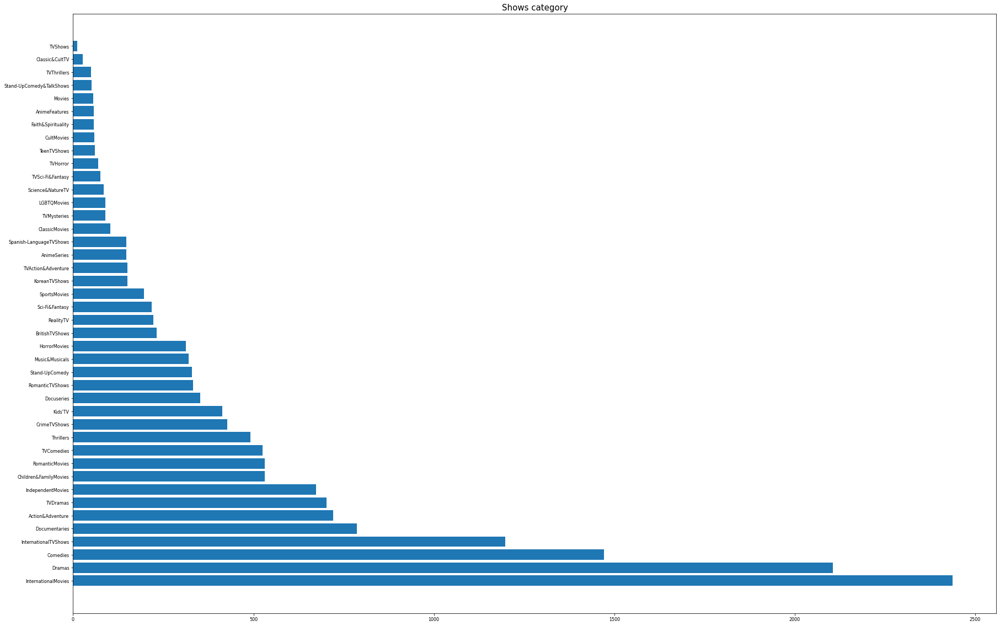

In [ ]:

list_cat=[]
list_cat_counter=[]
for i in range(1,no_nan_listed_in.shape[0]): 
  words=no_nan_listed_in.iloc[i,10].split(',')
  for iii in range(len(words)):
    words[iii]=words[iii].replace(',','')
    words[iii]=words[iii].replace(' ','')
    if words[iii] not in list_cat:
      list_cat.append(words[iii])
      list_cat_counter.append(1)
    else:
      list_cat_counter[list_cat.index(words[iii])]+=1

zipped_data=list(zip(list_cat, list_cat_counter))
zipped_data.sort(key = lambda x: x[1],reverse=True)
unzipped_data=list(zip(*zipped_data))
print(unzipped_data)
list_cat=unzipped_data[0]
list_cat_counter=unzipped_data[1]


fig,ax = plt.subplots()
fig.set_size_inches(30,20)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title("Shows category", fontsize=15)
plt.barh(list_cat, list_cat_counter)
plt.show()  

9.

Ομοίως με το υποερώτημα 5, αλλά χρησιμοποιούμε τη στήλη directors αντί της cast.

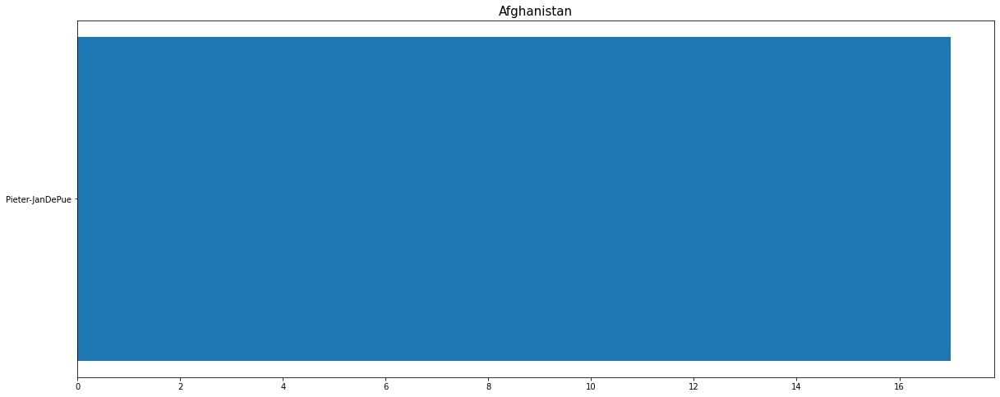

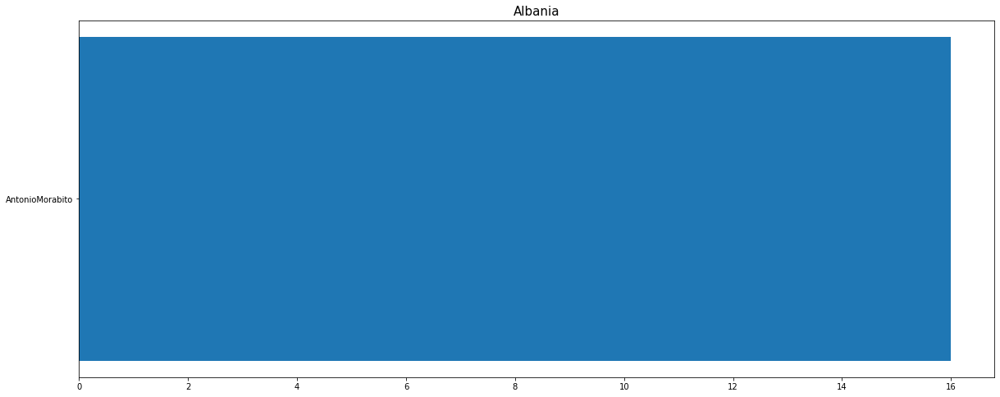

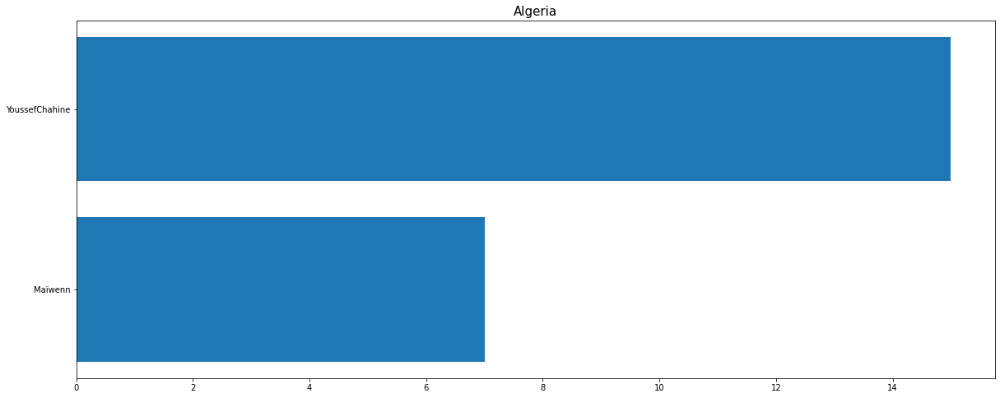

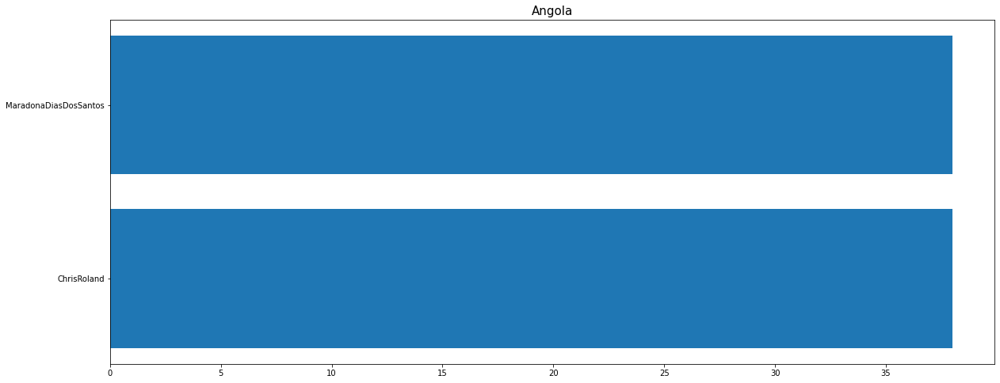

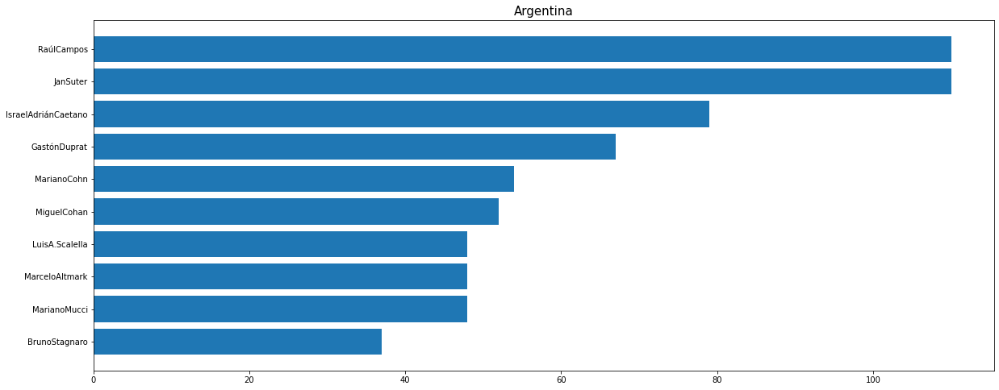

...

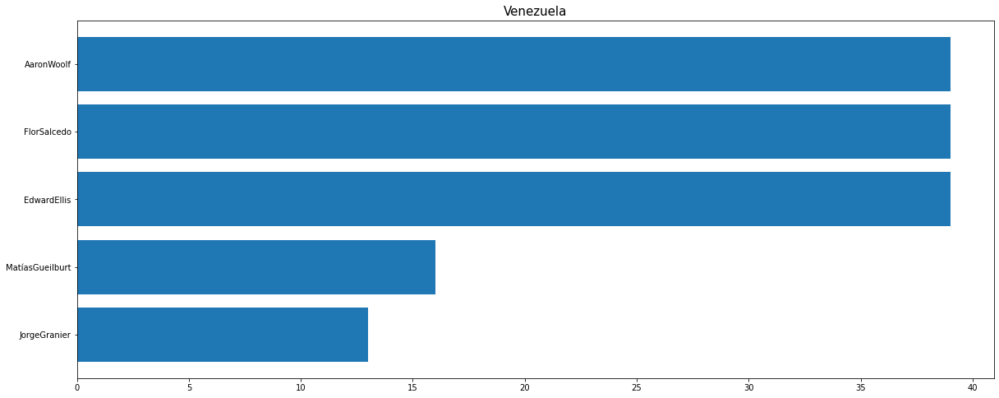

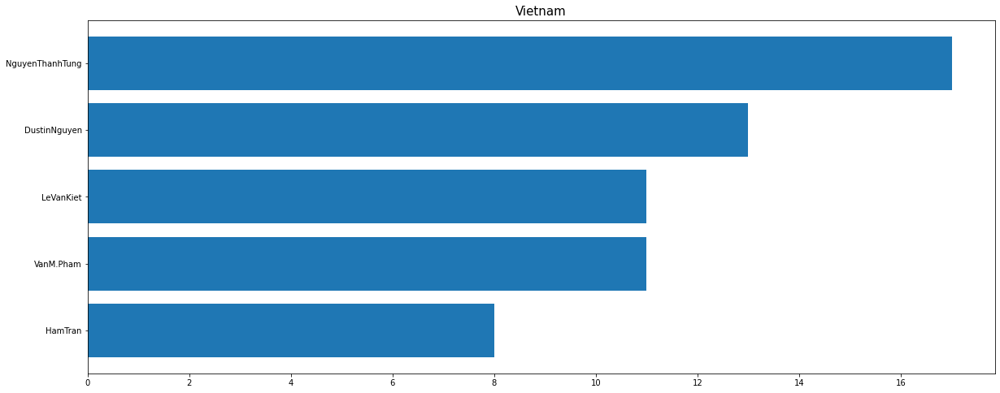

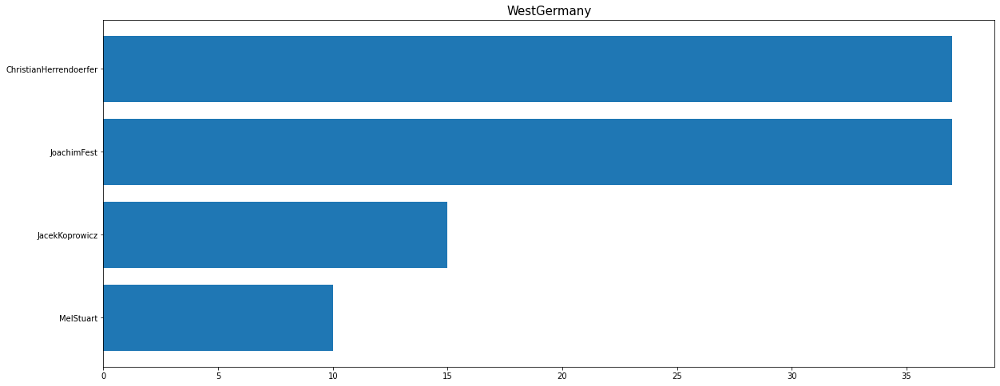

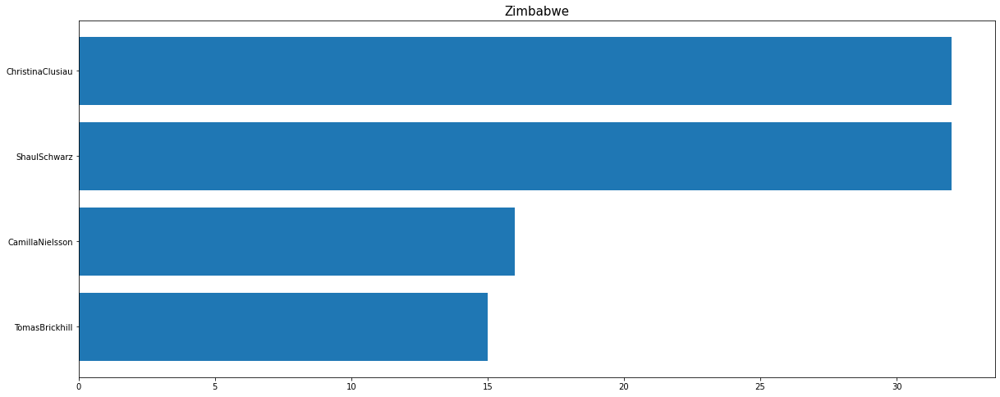

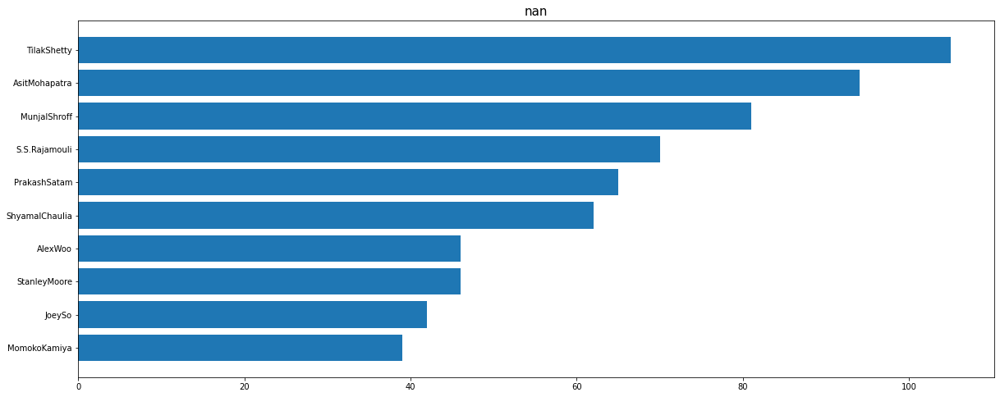

In [ ]:
directors_df=pd.DataFrame() 
directors_dataframe=pd.DataFrame() 
no_nan_country_df=pd.DataFrame()
no_nan_country_df=no_nan_country_df.append(dataframe_titles[dataframe_titles['country'].notnull()] )
directors_dataframe=directors_dataframe.append(dataframe_titles[dataframe_titles['director'].notnull()] )
directors_df=pd.concat([pd.Series(row['director'],str(row['country']).split(','))for _, row in directors_dataframe.iterrows()]).reset_index()
directors_df['index']=directors_df['index'].str.replace(' ','')
directors_df=directors_df.groupby('index')[0].apply(list).reset_index()
directornames=[]
directorappearences=[]
for i in range(1,directors_df.shape[0]):
  directornames=[]
  directorappearences=[]
  for ii in range(len(directors_df[0][i])):
    for iii in range(len(directors_df[0][i][ii])):
      words=directors_df[0][i][ii].split(',')
      for iiii in range(len(words)):
        words[iiii]=words[iiii].replace(',','')
        words[iiii]=words[iiii].replace(' ','')
        if words[iiii] not in directornames:
          directornames.append(words[iiii])
          directorappearences.append(1)
        else:
          directorappearences[directornames.index(words[iiii])]+=1
  top_10_idx = np.argsort(directorappearences)[-10:]
  top_10_values = [directorappearences[l] for l in top_10_idx]
  top_10_actors = [directornames[l] for l in top_10_idx]

  
  fig,ax = plt.subplots()
  fig.set_size_inches(20,8)
  font = {'family' : 'normal',
          'weight' : 'normal',
          'size'   : 10}

  matplotlib.rc('font', **font)

  plt.title(directors_df.iloc[i]['index'], fontsize=15)
  plt.barh(top_10_actors, top_10_values)
  plt.show()  


10.
Αφαιρούμε τις  εγγραφές με NaN duration από το dataframe με τις σειρέις και για κάθε εγγραφή αυξάνουμε τον ανάλογο μετρητή εαν υπάρχει, αλλιώς τον δημιουργούμε. Ύστερα, τους ταξινομούμε και φτίαχνουμε το γράφο.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


[('1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '13', '12', '15', '16'), (1608, 382, 184, 86, 58, 30, 19, 18, 8, 6, 3, 2, 2, 2, 1)]


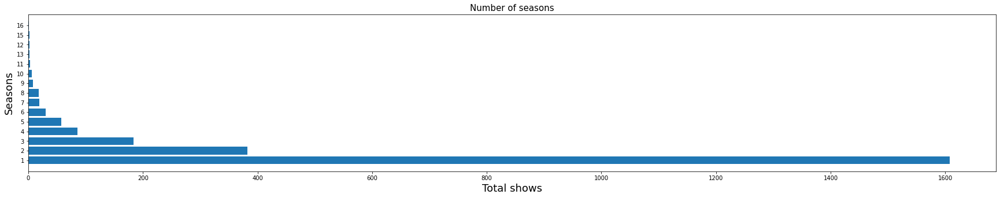

In [ ]:
seasons_dataframe=pd.DataFrame() 
no_nan_seasons=pd.DataFrame()

no_nan_seasons=no_nan_seasons.append(dataframe_titles[dataframe_titles['duration'].notnull()])
seasons_dataframe= seasons_dataframe.append(no_nan_seasons[no_nan_seasons['type'] == 'TV Show'])
number_of_seasons=[]
season_counter=[]
for i in range(1,seasons_dataframe.shape[0]):
  mystr=seasons_dataframe.iloc[i,9].split(' ')[0]
  if mystr not in number_of_seasons:
    number_of_seasons.append(mystr)
    season_counter.append(1)
  else:
    season_counter[number_of_seasons.index(mystr)]+=1


zipped_data=list(zip(number_of_seasons, season_counter))
zipped_data.sort(key = lambda x: x[1],reverse=True)
unzipped_data=list(zip(*zipped_data))
print(unzipped_data)
number_of_seasons=unzipped_data[0]
season_counter=unzipped_data[1]

fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)

plt.title("Number of seasons", fontsize=15)
plt.xlabel("Total shows", fontsize=18)
plt.ylabel("Seasons", fontsize=18)
plt.barh(number_of_seasons, season_counter)
plt.show()  

11.
Αφαιρούμε τις εγγραφές με NaN τίτλους και ratings. Στη συνέχεια κάνουμε cross reference τις ταινίες του Netflix με αυτές του imdb και κρατάμε το average vote. Εφόσον το imdb movies παρέχει τη μέση βαθμολογία δεν χρειάζεται να συμβουλευτούμε και το imdb_ratings. Τέλος αφαιρούμε τα duplicates και εκτυπώνουμε τις 10 πιο υψηλόβαθμες ταινίες.

                              title  avg_vote
3094                   Pulp Fiction       8.9
3408               Schindler's List       8.9
1852                      Inception       8.8
318   Ani... Dr. Kashinath Ghanekar       8.6
910                     City of God       8.6
1222         Eh Janam Tumhare Lekhe       8.6
1532                       Gol Maal       8.6
2150                        Koshish       8.6
2673         Much Ado About Nothing       8.6
2880          Oththa Seruppu Size 7       8.6


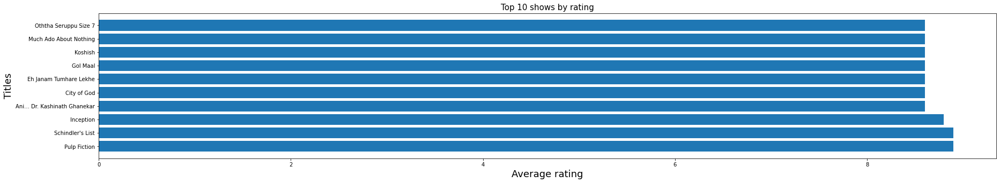

In [ ]:

netflix_dataframe=pd.DataFrame()
Cross_dataframe=pd.DataFrame()
clean_titles_netflix=pd.DataFrame()
imdb_movies=pd.DataFrame()

clean_titles_netflix=clean_titles_netflix.append(dataframe_titles[dataframe_titles['title'].notnull()])

imdb_movies=imdb_movies.append(dataframe_movies[dataframe_movies['title'].notnull()])
imdb_movies=imdb_movies.append(dataframe_movies[dataframe_movies['avg_vote'].notnull()])

netflix_dataframe=netflix_dataframe.append(clean_titles_netflix[clean_titles_netflix['type'] == 'Movie'])

netflix_dataframe = netflix_dataframe["title"]
imdb_movies = imdb_movies[["title","avg_vote"]]

Cross_dataframe=pd.merge(netflix_dataframe,imdb_movies,on='title')
Cross_dataframe=Cross_dataframe.drop_duplicates()
Cross_dataframe=Cross_dataframe.nlargest(10,'avg_vote')
print(Cross_dataframe)
fig,ax = plt.subplots()
fig.set_size_inches(30,5)
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 10}

matplotlib.rc('font', **font)
title_list=Cross_dataframe['title'].values.tolist()
avg_vote_list=Cross_dataframe['avg_vote'].values.tolist()

plt.title("Top 10 shows by rating", fontsize=15)
plt.xlabel("Average rating", fontsize=18)
plt.ylabel("Titles", fontsize=18)
plt.barh(title_list,avg_vote_list)
plt.show()  

PART 2

1. a+b
Από το netflix_titles Dataframe αφαιρεί τις εγγραφές με NaN description/title και δημιουργεί λίστα [title,description] για κάθε εγγραφή. Στη συνέχεια υπολογίζει το boolean BoW/tf-idf για unigrams/bigrams.

In [ ]:
mystr=[]
no_nan_desc_df=pd.DataFrame() 
temp_dataframe=pd.DataFrame()
temp_dataframe=temp_dataframe.append(dataframe_titles[dataframe_titles['description'].notnull()] )
no_nan_desc_df=no_nan_desc_df.append(temp_dataframe[temp_dataframe['type']=='Movie'] )
for i in range(no_nan_desc_df.shape[0]):
  mystr.append(no_nan_desc_df.iloc[i,2]+" "+no_nan_desc_df.iloc[i,11])
vectorizer = CountVectorizer(stop_words='english', ngram_range=(1, 1),analyzer='word',max_features=5000,binary=True,min_df=0.0016)
unigram = vectorizer.fit_transform(mystr)
print(vectorizer.get_feature_names())
vectorizer2 = CountVectorizer(stop_words='english',analyzer='word', ngram_range=(2, 2),max_features=5000,binary=True,min_df=0.0004)
bigram = vectorizer2.fit_transform(mystr)
vectorizer3 = TfidfVectorizer(stop_words='english',analyzer='word', ngram_range=(1, 1),max_features=5000,min_df=0.0016)
tfidf_unigram = vectorizer3.fit_transform(mystr)
vectorizer4 = TfidfVectorizer(stop_words='english',analyzer='word', ngram_range=(2, 2),max_features=5000,min_df=0.0004)
tfidf_bigram = vectorizer4.fit_transform(mystr)

['000', '10', '100', '11', '12', '13', '15', '16', '17', '18', '1960s', '1970s', '1980s', '1992', '20', '30', '40', '50', 'abandoned', 'abducted', 'ability', 'aboard', 'abuse', 'abusive', 'academy', 'accepts', 'access', 'accident', 'accidentally', 'account', 'accused', 'act', 'acting', 'action', 'activist', 'activists', 'actor', 'actors', 'actress', 'actually', 'adaptation', 'addiction', 'adult', 'adventure', 'adventures', 'adventurous', 'affair', 'afghanistan', 'afloat', 'africa', 'african', 'aftermath', 'age', 'aged', 'agency', 'agent', 'agents', 'aging', 'ago', 'agrees', 'ahead', 'aid', 'ailing', 'aims', 'air', 'alex', 'alien', 'aliens', 'alike', 'alive', 'alter', 'ambitions', 'ambitious', 'america', 'american', 'amid', 'amy', 'ancient', 'angeles', 'animal', 'animals', 'animated', 'anniversary', 'answers', 'anthology', 'anti', 'antics', 'apart', 'apartment', 'app', 'appears', 'architect', 'area', 'argentina', 'argentine', 'armed', 'army', 'arranged', 'arrival', 'arrives', 'arrogant'

2.a
Για κάθε χώρα βρίσκουμε το jaccard_score της μαζί με κάθε άλλη χώρα και το αποθηκεύουμε σε λιστα ενός dictionary με key το όνομα της χώρας αυτής. 

In [ ]:
recoms={}
unigram1=unigram.toarray()
for i in range(int(no_nan_desc_df.shape[0]/100)):
  recoms[no_nan_desc_df.iloc[i,2]]=[]
  for j in range(int(no_nan_desc_df.shape[0]/100)):
    if i==j:
      continue
    else:
      recoms[no_nan_desc_df.iloc[i,2]].append([no_nan_desc_df.iloc[j,2],jaccard_score(unigram1[i],unigram1[j])])
print(recoms)

{'7:19': [['23:59', 0.0], ['9', 0.0], ['21', 0.0], ['122', 0.0], ['187', 0.045454545454545456], ['706', 0.0], ['1920', 0.0], ['1922', 0.0], ['2,215', 0.0], ['3022', 0.0], ['Oct-01', 0.0], ['22-Jul', 0.05], ['15-Aug', 0.0], ["'89", 0.0], ['\u200b\u200bKuch Bheege Alfaaz', 0.0], ['\u200bGoli Soda 2', 0.0], ['\u200bMaj Rati \u200b\u200bKeteki', 0.0], ['\u200bMayurakshi', 0.0], ['(T)ERROR', 0.05263157894736842], ['#Alive', 0.1], ['#AnneFrank - Parallel Stories', 0.058823529411764705], ['#cats_the_mewvie', 0.0], ['#FriendButMarried', 0.0], ['#FriendButMarried 2', 0.0], ['#realityhigh', 0.0], ['#Roxy', 0.0], ['#Rucker50', 0.05263157894736842], ['#Selfie', 0.0], ['#Selfie 69', 0.0], ['¡Ay, mi madre!', 0.0], ['Çarsi Pazar', 0.0], ['Ég man þig', 0.0], ['Çok Filim Hareketler Bunlar', 0.0], ['Òlòtūré', 0.0], ['Æon Flux', 0.0], ['1 Chance 2 Dance', 0.0], ['1 Mile to You', 0.0], ['10 Days in Sun City', 0.038461538461538464], ['10 jours en or', 0.0], ['10,000 B.C.', 0.0], ['100 Days Of Solitude', 0.

2.b
Εισάγουμε τα tf-idf uni/bigrams στην cosine_similarity και από κάθε λίστα που παράγει βρίσκουμε το index των 100 μεγαλύτερων τιμών. Ύστερα εισάγουμε κάθε μία από τις τιμές αυτές στο dictionary.

In [ ]:

temp3=no_nan_desc_df.shape[0]
co_uni=cosine_similarity(tfidf_unigram)
co_bi=cosine_similarity(tfidf_bigram)
dict_list={}
dict_list2={}
for i in range(len(co_uni)):
  dict_list[no_nan_desc_df.iloc[i,2]]=[]
  res = sorted(range(len(co_uni[i])), key = lambda sub: co_uni[i][sub])[-100:]
  for j in res:
    dict_list[no_nan_desc_df.iloc[i,2]].append(no_nan_desc_df.iloc[j,2])
dict_list


{'7:19': ['Mau Nieto: Viviendo sobrio… desde el bar',
  "Jack Whitehall: I'm Only Joking",
  'Viswasapoorvam Mansoor',
  'The Command',
  'Aziz Ansari: Buried Alive',
  'In The Deep',
  'The Chosen',
  'Mine 9',
  'Tig',
  'The Matrix Revolutions',
  'When Angels Sleep',
  'The Crimes That Bind',
  'ARQ',
  'Ravenous',
  'Aggretsuko: We Wish You a Metal Christmas',
  'Concussion',
  'He Never Died',
  'Season of the Witch',
  'No One Will Ever Know',
  'Los Niños Héroes de Chapultepec',
  'El Especial de Alex Fernández, el Especial',
  'Company',
  'Kill Me If You Dare',
  'Belmonte',
  'Namak Halaal',
  'Fire in Paradise',
  'The Son',
  'You Get Me',
  'The Princess and the Frog',
  'From One Second to the Next',
  'Tremors 2: Aftershocks',
  'Gosford Park',
  'ROMA',
  'Alive and Kicking',
  'The Captive',
  'Pandora',
  '22-Jul',
  'Final Destination 3',
  'Survivors Guide to Prison',
  'Simplemente Manu NNa',
  'Aurora',
  'Invisible',
  'Desperados',
  'Fireworks',
  'Occupation'

In [ ]:
for i in range(len(co_bi)):
  dict_list2[no_nan_desc_df.iloc[i,2]]=[]
  res = sorted(range(len(co_bi[i])), key = lambda sub: co_bi[i][sub])[-100:]
  for j in res:
    dict_list2[no_nan_desc_df.iloc[i,2]].append(no_nan_desc_df.iloc[j,2])
dict_list2

{'7:19': ['Woodstock',
  'Woody Woodpecker',
  'Work It',
  'World Famous Lover',
  'World Trade Center',
  "World's Weirdest Homes",
  'Would You Rather',
  'Wrong No.',
  'Wrong Side Raju',
  'WWII: Report from the Aleutians',
  'Wyatt Cenac: Brooklyn',
  'Wyatt Earp',
  'X Large',
  'X: Past Is Present',
  'XOXO',
  'XV: Beyond the Tryline',
  'XX',
  'XXx',
  'XXX: State of the Union',
  'Y Tu Mamá También',
  'Y.M.I.: Yeh Mera India',
  'Ya no estoy aquí: Una conversación entre Guillermo del Toro y Alfonso Cuarón',
  'Yaadein',
  'Yaar Gaddar',
  'Yaara O Dildaara',
  'Yamla Pagla Deewana 2',
  'Yanda Kartavya Aahe',
  'يوم الدين',
  'Yeh Ballet',
  'Yeh Hai Bakrapur',
  'Yellowbird',
  'Yes Man',
  'Yes or No',
  'Yes or No 2',
  'Yes or No 2.5',
  'Yes, God, Yes',
  'Yo-Kai Watch: The Movie',
  'Yoga Hosers',
  'Yoko and His Friends',
  'Yoo Byung Jae: Discomfort Zone',
  'Yoo Byung Jae: Too Much Information',
  'You Are My Home',
  'You Can Tutu',
  'You Can’t Fight Christmas',

3.
Η συνάρτηση διακρίνει περιπτώσεις ανάλογα με το method και uni/bigram και δημιουργεί μία λίστα [[title,jaccard_score]] όπου το jaccard_score το είναι το jaccard score όλων της ταινίας με τίτλο title. Στην περίπτωση του tf-idf υπολογίζουμε cosine similarity και κρατάμε την λίστα της ταινίας που μας αφορά. Από την τελική λίστα επιστρέφουμε ταξινομημένα τα top n αποτελέσματα.  

In [ ]:
def get_similar_movies1(title,n,method,gram):
  if gram=='unigram' and method=='boolean':
    mygram=unigram.toarray()
  elif gram=='bigram' and method=='boolean':
    mygram=bigram.toarray()
  elif gram=='unigram' and method=='tf-idf':
    mygram=tfidf_unigram.toarray()
  elif gram=='bigram' and method=='tf-idf':
    mygram=tfidf_bigram.toarray()
  else:
    print("Bad input (expected uni/bigram)")
    return
  if method=='boolean':
    mylist=[]
    for k in range(no_nan_desc_df.shape[0]):
      if no_nan_desc_df.iloc[k,2]==title:
        break; 
    
    for i in range(no_nan_desc_df.shape[0]):
      if no_nan_desc_df.iloc[i,2]==title:
        continue
      else:
        mylist.append([no_nan_desc_df.iloc[i,2],jaccard_score(mygram[k],mygram[i])])
  elif method=='tf-idf':
    mylist=[]
    for k in range(no_nan_desc_df.shape[0]):
      if no_nan_desc_df.iloc[k,2]==title:
        break; 
    cosine_list=cosine_similarity(tfidf_unigram)[k]
    for i in range(no_nan_desc_df.shape[0]):
      if i==k:
        continue
      else:
        mylist.append([no_nan_desc_df.iloc[i,2],cosine_list[i]])
  mylist.sort(key = lambda x: x[1],reverse=True)
  return mylist[:n]




print(get_similar_movies1('Yes or No',8,'tf-idf','bigram'))

[['Horse Girl', 0.3065272660879634], ['Baxu and the Giants', 0.30286569677698294], ['White Girl', 0.26842595127266694], ['Kuppivala', 0.26338622477108287], ['P', 0.258518822645922], ['Time Share', 0.24246181415829485], ['The Intent', 0.23166585716086247], ["Okko's Inn", 0.22807486980935662]]


4.Αρχικά προσθέτουμε στο όρισμα uni/bigram την περιγραφή που μας δίνεται. Η συνάρτηση διακρίνει περιπτώσεις ανάλογα με το method και uni/bigram και δημιουργεί μία λίστα [[title,jaccard_score]] όπου το jaccard_score το είναι το jaccard score της ταινίας με το description με τίτλο title. Στην περίπτωση του tf-idf υπολογίζουμε cosine similarity και κρατάμε την πρώτη λίστα καθώς αναφέρεται στο description που εισάγαμε στην αρχή της συνάρτησης. Από την τελική λίστα επιστρέφουμε ταξινομημένα τα top n αποτελέσματα. 

In [ ]:
def get_similar_movies2(desc_str,n,method,gram):
  mystr=[]
  for i in range(no_nan_desc_df.shape[0]):
    mystr.append(no_nan_desc_df.iloc[i,2]+no_nan_desc_df.iloc[i,11])
  mystr.insert(0,desc_str)
  desc_str=mystr
  # print(desc_str)
  if gram=='unigram' and method=='boolean':
    vectorizer = CountVectorizer(stop_words='english',analyzer='word', ngram_range=(1, 1),max_features=5000,binary=True,min_df=0.0016)
    mygram = vectorizer.fit_transform(desc_str).toarray()
  elif gram=='bigram' and method=='boolean':
    vectorizer = CountVectorizer(stop_words='english',analyzer='word', ngram_range=(2, 2),max_features=5000,binary=True,min_df=0.0004)
    mygram = vectorizer.fit_transform(desc_str).toarray()
  elif gram=='unigram' and method=='tf-idf':
    vectorizer3 = TfidfVectorizer(stop_words='english',analyzer='word', ngram_range=(1, 1),max_features=5000,min_df=0.0016)
    mygram = vectorizer3.fit_transform(desc_str).toarray()
  elif gram=='bigram' and method=='tf-idf':
    vectorizer3 = TfidfVectorizer(stop_words='english',analyzer='word', ngram_range=(2, 2),max_features=5000,min_df=0.0004)
    mygram = vectorizer3.fit_transform(desc_str).toarray()
  else:
    print("Bad input (expected uni/bigram)")
    return
  mylist2=[]
  if gram=='unigram' and method=='boolean':
    for i in range(no_nan_desc_df.shape[0]):
      mylist2.append([no_nan_desc_df.iloc[i,2],jaccard_score(mygram[0],mygram[i+1])])  
  elif gram=='bigram' and method=='boolean':
    for i in range(no_nan_desc_df.shape[0]):
      mylist2.append([no_nan_desc_df.iloc[i,2],jaccard_score(mygram[0],mygram[i+1])])  
  elif method=='tf-idf':
    cosinelist=cosine_similarity(mygram)
    for i in range(no_nan_desc_df.shape[0]):
      mylist2.append([no_nan_desc_df.iloc[i,2],cosinelist[0][i+1]])  
  mylist2.sort(key = lambda x: x[1],reverse=True)
  return mylist2[:n]
  


get_similar_movies2('happy sad hate love',8,'boolean','unigram')

[['AllI Wish', 0.2222222222222222],
 ['Mandi', 0.2],
 ['The Hows of Us', 0.2],
 ['Amar', 0.16666666666666666],
 ['Humko Deewana Kar Gaye', 0.16666666666666666],
 ['Leyla Everlasting', 0.16666666666666666],
 ['Love Ni Bhavai', 0.16666666666666666],
 ['Love Station', 0.16666666666666666]]